In [1]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

import matplotlib.pyplot as plt
import numpy as np
import glob
import json
import os
import pandas as pd

### Get the data from cluster

To get data we need for the hyperparameter search, run the following command with the right path from your local machine in the main directory of the replay repo

`rsync -av --progress rcdavis@ssh.swc.ucl.ac.uk:/nfs/nhome/live/rcdavis/Replay/data/resultsData/ data/resultsData --include *_log_p_hist* --exclude *.csv --exclude trainingData --exclude data_readme*`

In [2]:
#run_list_dirs = glob.glob("../data/resultsData/Coarse_Hyperparameter_Sweep_Thin/*")
#run_list_dirs = glob.glob("../data/resultsData/*")
run_list_dirs = glob.glob("/home/rodrigo/SSD/Projects/Replay/data/resultsData/best_behavior_run/*")

In [3]:
len(run_list_dirs)

1354

In [4]:
runs_dataset = []
for run_dir in run_list_dirs:
    
    # Locating directory of each run
    run_id = run_dir.split("/")[-1]
    
    
    # Loading files from each of the runs
    
    if os.path.isfile(os.path.join(run_dir, "config_file.json")) and run_id[0] != 'b':
        params = eval(json.load(open(os.path.join(run_dir, "config_file.json"), "r")))
        test_log_p = pd.read_csv(os.path.join(run_dir, "test_log_p_hist.csv"))
        train_log_p = pd.read_csv(os.path.join(run_dir, "train_log_p_hist.csv"))
        data_dict = {"params": params, "test_log_p": test_log_p, "train_log_p": train_log_p, "run_id": run_id}

        skip = False
        for i, value in enumerate(runs_dataset):
            if value[0]["params"] == params:
                runs_dataset[i].append(data_dict)
                skip = True
                break

        if not skip:
            runs_dataset.append([data_dict, ])

In [5]:
def get_avg_log_p(runs_dataset, train=True):
    avg_log_p = []
    std_log_p = []
    params = []
    for run in runs_dataset:
        if train:
            data_key = "train_log_p"
        else:
            data_key = "test_log_p"
        
        sub_run_log_p = []
        params.append(run[0]["params"])
        
        for sub_run in run:
            sub_run_log_p.append(sub_run[data_key].values[:, 0])
            
        sub_run_log_p = np.array(sub_run_log_p)
        
        avg_log_p.append(np.mean(sub_run_log_p, axis=0))
        std_log_p.append(np.std(sub_run_log_p, axis=0))
        
    return avg_log_p, std_log_p, params

def plot_avg_log_p(avg_log_p, std_log_p, params, param_keys=["num_sequence_types", ], plot_size=22, n_std_dev=2):
    f, ax = plt.subplots(36, 4, figsize=(plot_size, plot_size*9))
    ax = ax.flatten()
    for i, log_p in enumerate(avg_log_p):
        
        # Generate legend
        lab = ""
        for key in param_keys:
            lab += key + ": " + str(np.round(params[i][key], 2)) + "\n"
        
        y_err0 = log_p - n_std_dev*std_log_p[i]
        y_err1 = log_p + n_std_dev*std_log_p[i]
        ax[i].fill_between(np.arange(len(log_p)), y_err0, y_err1, alpha=0.5)
        ax[i].plot(log_p, label=lab)
        ax[i].legend()
        
def plot_by_attribute(avg_log_p, std_log_p, params, attr_label="num_sequence_types", attr_val=2, ax=None, xlim=None, ylim=None, n_std_dev=2):
    if ax is None:
        f, ax = plt.subplots(1, 1, figsize=(20, 12))
        
    convergence_avg_p = 0
    valid_comb = 0
    valid_p = []
    for i, log_p in enumerate(avg_log_p):
        
        if params[i][attr_label] == attr_val:
            # Generate legend
            lab = ""
            for key in param_keys:
                lab += key + ": " + str(np.round(params[i][key], 2)) + "\n"

            y_err0 = log_p - n_std_dev*std_log_p[i]
            y_err1 = log_p + n_std_dev*std_log_p[i]
            ax.fill_between(np.arange(len(log_p)), y_err0, y_err1, alpha=0.5)
            ax.plot(log_p)
            ax.set_title(attr_label + ": " + str(attr_val))
            valid_comb += 1
            convergence_avg_p += np.mean(log_p[-10:])
            valid_p.append(log_p)
            
    if xlim is not None:
        ax.set_xlim(xlim)
    if ylim is not None:
        ax.set_ylim(ylim)
    
    convergence_avg_p = convergence_avg_p/valid_comb
    text_x = np.mean(ax.get_xlim())
    text_y = ax.get_ylim()[0] + 0.1*(ax.get_ylim()[1] - ax.get_ylim()[0])
    ax.text(text_x, text_y, "average log p: "+str(np.round(convergence_avg_p, 2)), fontsize=12)
    
    mean_p = np.mean(np.stack(valid_p, axis=0), axis=0)
    
    return mean_p
    
def plot_best(avg_log_p, std_log_p, params, runs_dataset, param_keys=["num_sequence_types", ], n_std_dev=1, plot_n_best=5):

    f, ax = plt.subplots(plot_n_best, 1, figsize=(15, 7*plot_n_best))
    
    log_p_list = []

    for i, log_p in enumerate(avg_log_p):
        convergence_avg_p = np.mean(log_p[-50:])
        log_p_list.append(convergence_avg_p)
    log_p_list = np.array(log_p_list)
    
    ranking = np.argsort(log_p_list)
    ranking = np.flip(ranking)
    
    for rank_id in range(plot_n_best):
        best_id = ranking[rank_id]
        # Generate legend
        lab = ""
        for key in param_keys:
            lab += key + ": " + str(np.round(params[best_id][key], 2)) + "\n"

        y_err0 = avg_log_p[best_id] - n_std_dev*std_log_p[best_id]
        y_err1 = avg_log_p[best_id] + n_std_dev*std_log_p[best_id]

        ax[rank_id].fill_between(np.arange(len(avg_log_p[best_id])), y_err0, y_err1, alpha=0.5)

        runs = runs_dataset[best_id]
        for i, run in enumerate(runs):
            ax[rank_id].plot(run["test_log_p"].values, "C"+str(i+1), lw=4, label=run["run_id"])
            print(run["run_id"])

        ax[rank_id].plot(avg_log_p[best_id], label=lab)
        ax[rank_id].legend(loc="lower right")
        ax[rank_id].set_title("log_p: "+str(log_p_list[best_id]))       

In [6]:
avg_log_p, std_log_p, params = get_avg_log_p(runs_dataset, train=False)
num_params = len(avg_log_p)

In [7]:
log_p_per_param = np.zeros([num_params])
std_log_p_per_param = np.zeros([num_params])
for i, log_p in enumerate(avg_log_p):
    log_p_per_param[i]  = np.mean(log_p[-50:])
    std_log_p_per_param[i] = np.mean(std_log_p[i][-50:])
    sorted_indices = np.flip(np.argsort(log_p_per_param))
    
keys_to_print = {"num_sequence_types", "mean_bkgd_spike_rate", "var_bkgd_spike_rate", "mean_event_amplitude", 
              "var_event_amplitude", "neuron_response_conc_param", "seq_event_rate", "neuron_offset_pseudo_obs", "seq_event_rate"}
for i in range(10):
    print('Mean log L: \t \t', log_p_per_param[sorted_indices[i]])
    print('Error Bar L: \t \t', std_log_p_per_param[sorted_indices[i]])
    for key in keys_to_print:
        print(key, '\t \t', runs_dataset[sorted_indices[i]][0]['params'][key])
    #print(runs_dataset[sorted_indices[i]])
    print()

Mean log L: 	 	 9.157714258245194
Error Bar L: 	 	 0.0
seq_event_rate 	 	 5.0
num_sequence_types 	 	 5
mean_event_amplitude 	 	 11.720566233667837
var_bkgd_spike_rate 	 	 70.32339740200702
neuron_offset_pseudo_obs 	 	 1.0
mean_bkgd_spike_rate 	 	 70.32339740200702
neuron_response_conc_param 	 	 1.6
var_event_amplitude 	 	 117.20566233667837

Mean log L: 	 	 9.1139216723514
Error Bar L: 	 	 0.0
seq_event_rate 	 	 6.0
num_sequence_types 	 	 6
mean_event_amplitude 	 	 23.441132467335674
var_bkgd_spike_rate 	 	 70.32339740200702
neuron_offset_pseudo_obs 	 	 0.5
mean_bkgd_spike_rate 	 	 70.32339740200702
neuron_response_conc_param 	 	 3.0
var_event_amplitude 	 	 234.41132467335675

Mean log L: 	 	 9.089254308314587
Error Bar L: 	 	 0.17424116715974883
seq_event_rate 	 	 0.10000000000000002
num_sequence_types 	 	 5
mean_event_amplitude 	 	 23.441132467335674
var_bkgd_spike_rate 	 	 70.32339740200702
neuron_offset_pseudo_obs 	 	 5.0
mean_bkgd_spike_rate 	 	 70.32339740200702
neuron_response_c

In [8]:
param_keys = ["num_sequence_types", "mean_bkgd_spike_rate", "var_bkgd_spike_rate", "mean_event_amplitude", 
              "var_event_amplitude", "neuron_response_conc_param", "seq_event_rate", "neuron_offset_pseudo_obs", "seq_event_rate"]

grid_search_841_2709022_1955
grid_search_924_2809022_0711
grid_search_86_2409022_1841
grid_search_86_2809022_2259
grid_search_557_0110022_0220
grid_search_557_2609022_1344
grid_search_805_2709022_1516
grid_search_937_2809022_0742
grid_search_972_2809022_1259
grid_search_941_2809022_0830
grid_search_492_2609022_0822
grid_search_492_3009022_2234
grid_search_974_2809022_1212


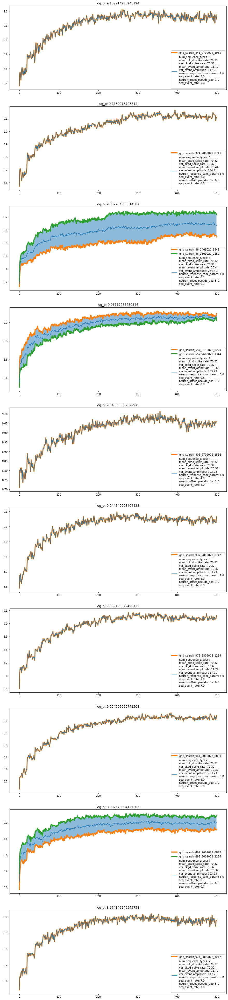

In [9]:
plot_best(avg_log_p, std_log_p, params,runs_dataset, param_keys, plot_n_best = 10)

In [10]:
get_keys_unique = ["num_sequence_types", "mean_bkgd_spike_rate", "var_bkgd_spike_rate", "mean_event_amplitude", 
              "var_event_amplitude", "neuron_response_conc_param", "seq_event_rate", "neuron_offset_pseudo_obs", "seq_event_rate"]
key_unique_values = {}

for key in get_keys_unique:
    param_list = []
    for p in params:
        param_list.append(p[key])
    key_unique_values[key] = np.unique(param_list)

In [76]:
key_unique_values["mean_event_amplitude"]

array([ 11.72056623,  23.44113247,  70.3233974 , 234.41132467])

In [82]:
def get_run_params(slurm_id):
    num_of_seqs = [4, 5, 6, 7]
    fudges = [0.05, 0.1, 0.3, 1.0]
    phis = [0.6, 1.0, 1.6, 3.0]
    ks = [0.5, 1.0, 5.0, 10.0]
    seq_event_factor = [0.1, 0.5, 1.0, 5.0]
    k_index = int(slurm_id%len(ks))
    index_leftover = (slurm_id - k_index)/len(ks)
    phi_index = np.rint(index_leftover%len(phis)).astype(int)
    index_leftover = (index_leftover - phi_index)/len(phis)
    fudge_index = np.rint(index_leftover%len(fudges)).astype(int)
    index_leftover = (index_leftover - fudge_index)/len(fudges)
    seq_index = np.rint(index_leftover%len(num_of_seqs)).astype(int)
    index_leftover = (index_leftover - seq_index)/len(num_of_seqs)
    seq_event_index = int(index_leftover%len(seq_event_factor))
    
    # print(k_index, phi_index, fudge_index, seq_index, seq_event_index)
    
    return num_of_seqs[seq_index], fudges[fudge_index], phis[phi_index], ks[k_index], seq_event_factor[seq_event_index]


for i in range(1024):
    print("num_of_seqs,", "fudges,", "phis,", "ks,", "seq_event_factor")
    print(get_run_params(i))


num_of_seqs, fudges, phis, ks, seq_event_factor
(4, 0.05, 0.6, 0.5, 0.1)
num_of_seqs, fudges, phis, ks, seq_event_factor
(4, 0.05, 0.6, 1.0, 0.1)
num_of_seqs, fudges, phis, ks, seq_event_factor
(4, 0.05, 0.6, 5.0, 0.1)
num_of_seqs, fudges, phis, ks, seq_event_factor
(4, 0.05, 0.6, 10.0, 0.1)
num_of_seqs, fudges, phis, ks, seq_event_factor
(4, 0.05, 1.0, 0.5, 0.1)
num_of_seqs, fudges, phis, ks, seq_event_factor
(4, 0.05, 1.0, 1.0, 0.1)
num_of_seqs, fudges, phis, ks, seq_event_factor
(4, 0.05, 1.0, 5.0, 0.1)
num_of_seqs, fudges, phis, ks, seq_event_factor
(4, 0.05, 1.0, 10.0, 0.1)
num_of_seqs, fudges, phis, ks, seq_event_factor
(4, 0.05, 1.6, 0.5, 0.1)
num_of_seqs, fudges, phis, ks, seq_event_factor
(4, 0.05, 1.6, 1.0, 0.1)
num_of_seqs, fudges, phis, ks, seq_event_factor
(4, 0.05, 1.6, 5.0, 0.1)
num_of_seqs, fudges, phis, ks, seq_event_factor
(4, 0.05, 1.6, 10.0, 0.1)
num_of_seqs, fudges, phis, ks, seq_event_factor
(4, 0.05, 3.0, 0.5, 0.1)
num_of_seqs, fudges, phis, ks, seq_event_factor


In [83]:
run_indexes = []
for data_dict_list in runs_dataset:
    for data_dict in data_dict_list:
        slurm_id = int(data_dict["run_id"].split("_")[2])
        run_indexes.append(slurm_id)
        # break

In [84]:
param_runs = pd.DataFrame(columns=["num_of_seqs", "fudges", "phis", "ks", "seq_event_factor"])
for i, run_index in enumerate(run_indexes):
    param_runs.loc[i] = get_run_params(run_index)

array([[<AxesSubplot:title={'center':'num_of_seqs'}>,
        <AxesSubplot:title={'center':'fudges'}>],
       [<AxesSubplot:title={'center':'phis'}>,
        <AxesSubplot:title={'center':'ks'}>],
       [<AxesSubplot:title={'center':'seq_event_factor'}>,
        <AxesSubplot:>]], dtype=object)

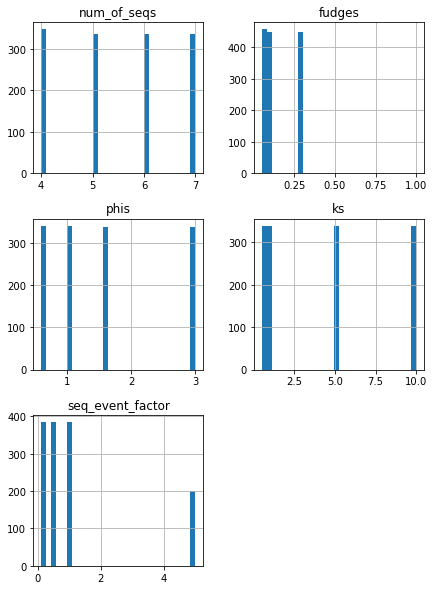

In [85]:
param_runs.hist(figsize=(7, 10), bins=30)

In [87]:
np.unique(param_runs["fudges"], return_counts=True)

(array([0.05, 0.1 , 0.3 , 1.  ]), array([457, 448, 448,   1]))

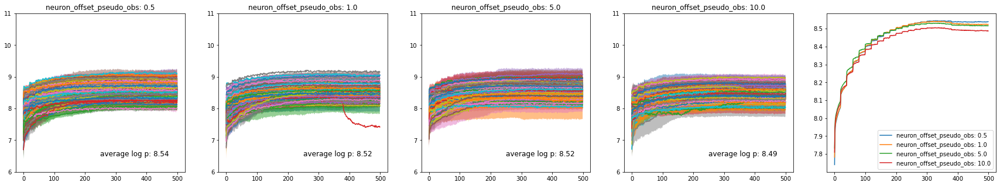

In [12]:
plot_key = "neuron_offset_pseudo_obs"
list_vals = key_unique_values[plot_key]
f, ax = plt.subplots(1, len(list_vals)+1, figsize=(6*(len(list_vals)+1), 5))
ylim = (6, 11)
for i, num_seq in enumerate(list_vals):
    mean_p = plot_by_attribute(avg_log_p, std_log_p, params, ax=ax[i], attr_label=plot_key, attr_val=num_seq, ylim=ylim, n_std_dev=1)
    ax[-1].plot(mean_p, label=plot_key+": "+str(np.round(num_seq, 2)))
ax[-1].legend()

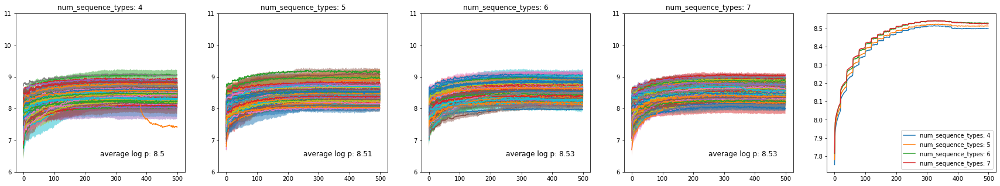

In [13]:
plot_key = "num_sequence_types"
list_vals = key_unique_values[plot_key]
f, ax = plt.subplots(1, len(list_vals)+1, figsize=(6*(len(list_vals)+1), 5))
ylim = (6, 11)
for i, num_seq in enumerate(list_vals):
    mean_p = plot_by_attribute(avg_log_p, std_log_p, params, ax=ax[i], attr_label=plot_key, attr_val=num_seq, ylim=ylim, n_std_dev=1)
    ax[-1].plot(mean_p, label=plot_key+": "+str(np.round(num_seq, 2)))
ax[-1].legend()

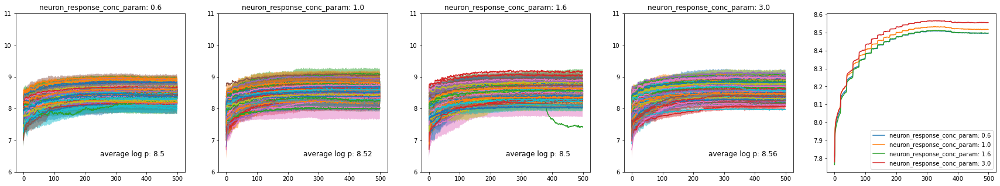

In [14]:
plot_key = "neuron_response_conc_param"
list_vals = key_unique_values[plot_key]
f, ax = plt.subplots(1, len(list_vals)+1, figsize=(6*(len(list_vals)+1), 5))
ylim = (6, 11)
for i, num_seq in enumerate(list_vals):
    mean_p = plot_by_attribute(avg_log_p, std_log_p, params, ax=ax[i], attr_label=plot_key, attr_val=num_seq, ylim=ylim, n_std_dev=1)
    ax[-1].plot(mean_p, label=plot_key+": "+str(np.round(num_seq, 2)))
ax[-1].legend()

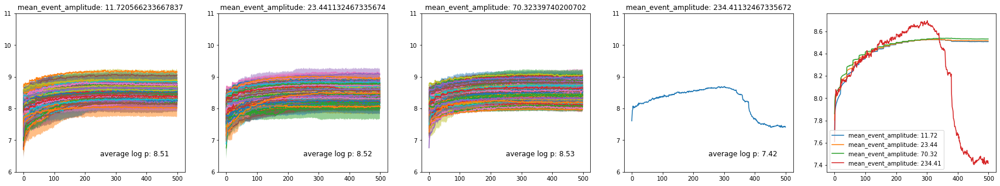

In [15]:
plot_key = "mean_event_amplitude"
list_vals = key_unique_values[plot_key]
f, ax = plt.subplots(1, len(list_vals)+1, figsize=(6*(len(list_vals)+1), 5))
ylim = (6, 11)
for i, num_seq in enumerate(list_vals):
    mean_p = plot_by_attribute(avg_log_p, std_log_p, params, ax=ax[i], attr_label=plot_key, attr_val=num_seq, ylim=ylim, n_std_dev=1)
    ax[-1].plot(mean_p, label=plot_key+": "+str(np.round(num_seq, 2)))
ax[-1].legend()

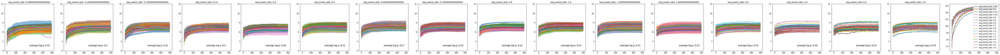

In [16]:
plot_key = "seq_event_rate"
list_vals = key_unique_values[plot_key]
f, ax = plt.subplots(1, len(list_vals)+1, figsize=(6*(len(list_vals)+1), 5))
ylim = (6, 11)
for i, num_seq in enumerate(list_vals):
    mean_p = plot_by_attribute(avg_log_p, std_log_p, params, ax=ax[i], attr_label=plot_key, attr_val=num_seq, ylim=ylim, n_std_dev=1)
    ax[-1].plot(mean_p, label=plot_key+": "+str(np.round(num_seq, 2)))
ax[-1].legend()

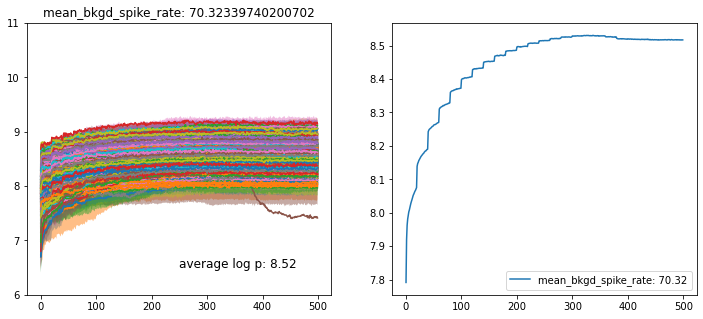

In [17]:
plot_key = "mean_bkgd_spike_rate"
list_vals = key_unique_values[plot_key]
f, ax = plt.subplots(1, len(list_vals)+1, figsize=(6*(len(list_vals)+1), 5))
ylim = (6, 11)
for i, num_seq in enumerate(list_vals):
    mean_p = plot_by_attribute(avg_log_p, std_log_p, params, ax=ax[i], attr_label=plot_key, attr_val=num_seq, ylim=ylim, n_std_dev=1)
    ax[-1].plot(mean_p, label=plot_key+": "+str(np.round(num_seq, 2)))
ax[-1].legend()

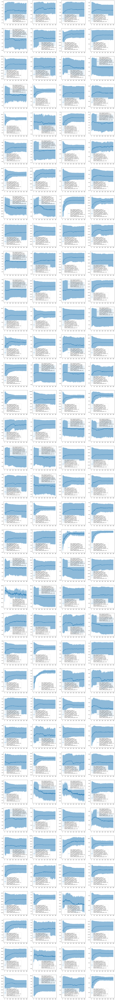

In [319]:
plot_avg_log_p(avg_log_p, std_log_p, params, param_keys, plot_size=24, n_std_dev=1)